In [2]:
import os
import pyxdf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.signal import filtfilt, iirnotch, detrend, butter, cheby1, lfilter
import digital_processing as dp
import feature_extraction as fe

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn import svm
from sklearn.feature_selection import RFECV, RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler


def bandpass_filter(input_signal, sr, lowcut, highcut, order=5):
    
    nyq = 0.5 * sr # Nyquist frequency
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype="band")
    output_signal = filtfilt(b, a, input_signal)
    
    return output_signal

def filter_signals(emg_stream):
    # Set variables
    l_bandpass = 10
    h_bandpass = 400
    sample_rate = int(emg_stream['info']['nominal_srate'][0])

    # Get signal information from the XDF file and apply filters
    l_ear_emg = emg_stream["time_series"][:, 0] - emg_stream["time_series"][:, 1] # Left ear EMG
    l_ear_emg = bandpass_filter(detrend(l_ear_emg), sample_rate, l_bandpass, h_bandpass)

    r_ear_emg = emg_stream["time_series"][:, 2] - emg_stream["time_series"][:, 3] # Right ear EMG
    r_ear_emg = bandpass_filter(detrend(r_ear_emg), sample_rate, l_bandpass, h_bandpass)

    return l_ear_emg, r_ear_emg

def plot_signal(signal, n_ear = ""):
    # Plot signals
    plt.figure(figsize=(16,3))

    plt.plot(signal)
    plt.title(f"{n_ear.capitalize()} Ear")

    plt.show()

def structure_data(emg_stream, EMGinfo_stream, ear_class, ear_emg, sample_rate, time_window=0.5):

    if emg_stream["time_stamps"][0] - EMGinfo_stream["time_stamps"][0] > 0: # This condition is true when EMG signal starts recording AFTER the classification, which makes no sense

        # Find the closest timestamp in the EMGinfo stream to the first timestamp in the EMG stream
        emg_first_timestamp = emg_stream["time_stamps"][0]
        emginfo_timestamps = EMGinfo_stream["time_stamps"]

        closest_index = np.abs(emginfo_timestamps - emg_first_timestamp).argmin()
        print(f"EMG stream starts after classification stream. Closest index: {closest_index}")
    else:
        closest_index = 0
        print(f"EMG stream starts at the same time as the classification stream. Closest index: {closest_index}")
    
    
    # This code will extract a window of EMG data before each class label in the EMGinfo stream and store it in a DataFrame
    # Corresponding number of samples based on frequency and the time window
    samples_window = int(sample_rate * time_window)

    # Create an empty DataFrame
    columns = ['class_label'] + ["stream_idx"] + [f'emg_{i}' for i in range(samples_window)]
    df = pd.DataFrame(columns=columns)

    for class_time, class_label in zip(EMGinfo_stream['time_stamps'][closest_index:], ear_class):
        # Find the closest timestamp in the EMG stream
        idx = np.abs(emg_stream['time_stamps'] - class_time).argmin()
        
        # Check if we can extract a full window of data without going out of bounds
        if idx >= samples_window:
            # Extract EMG data for the window
            emg_data_window = ear_emg[idx - samples_window:idx]
            
            # Append to the DataFrame
            row_data = [class_label] + [idx] + emg_data_window.tolist()
            df.loc[len(df)] = row_data
    
    return df

def get_features(ear_df, sample_rate, time_window=0.5, name=""):

    frame = int(time_window*sample_rate) # Number of samples in the time window

    ear_df_values = ear_df.iloc[:, 2:].values # Get the values of the EMG data from the 2nd column onwards

    output_df = pd.DataFrame()  # Create an empty dataframe to store the outputs

    for row in ear_df_values:
        features_df, _ = fe.features_estimation(row, name, sample_rate, frame, 1, plot=False, verbose=False)  # Call the features_estimation function
        output_df = pd.concat([output_df, features_df], axis=1)  # Concatenate the features dataframe to the output dataframe column by column

    return pd.concat([ear_df.reset_index(drop=True), output_df.T.reset_index(drop=True)], axis=1) # Concatenate the output dataframe with the original dataframe

def filter_signals_2(emg_stream):

    # Set variables
    l_bandpass = 10
    h_bandpass = 400
    sample_rate = int(emg_stream['info']['nominal_srate'][0])

    l_ear_emg = emg_stream["time_series"][:, 0] - emg_stream["time_series"][:, 1] # Left ear EMG
    r_ear_emg = emg_stream["time_series"][:, 2] - emg_stream["time_series"][:, 3] # Right ear EM

    # Filter the 50Hz armonics (50, 100, 150, 200 Hz)
    for i in range(50, 250, 50):
        l_ear_notch = dp.notch_filter(l_ear_emg, sample_rate, i, False)
        r_ear_notch = dp.notch_filter(r_ear_emg, sample_rate, i, False)

    # Apply bandpass filters 
    l_ear_bandpass = dp.bp_filter(l_ear_notch, l_bandpass, h_bandpass, sample_rate, False)
    r_ear_bandpass = dp.bp_filter(r_ear_notch, l_bandpass, h_bandpass, sample_rate, False)

    # Apply wavelet denoising
    l_ear_denoise = dp.denoisewavelet(l_ear_bandpass)
    r_ear_denoise = dp.denoisewavelet(r_ear_bandpass)

    return l_ear_denoise, r_ear_denoise

def process_xdf(path):
    
    folders = path.split("/")[:-1]
    folder = "/".join(folders)
    
    csv_file_l = folder + '/l_ear_features_' + folders[-1] + '.csv'
    csv_file_r = folder + '/r_ear_features_' + folders[-1] + '.csv'

    print(f"Data in folder {folder} is being processed.")

    print("Checking if csv files exist.")
    if os.path.exists(csv_file_l) and os.path.exists(csv_file_r):
        print("Files exist. Loading csv files.")
        l_ear_features_df = pd.read_csv(csv_file_l)
        r_ear_features_df = pd.read_csv(csv_file_r)
    
    else:
        print("Files do not exist. Creating csv files.")
        data, _ = pyxdf.load_xdf(path)

        EMGinfo_stream = [stream for stream in data if stream["info"]["name"][0] == "EMGinfo"][0]
        emg_stream = [stream for stream in data if "eegoSports " in stream["info"]["name"][0]][0]

        sample_rate = int(emg_stream['info']['nominal_srate'][0])
        time_window = 0.5

        l_ear_emg, r_ear_emg = filter_signals_2(emg_stream)
        l_ear_class = EMGinfo_stream["time_series"][:, 6]
        r_ear_class = EMGinfo_stream["time_series"][:, 7]

        l_ear_df = structure_data(emg_stream, EMGinfo_stream, ear_class=l_ear_class, ear_emg=l_ear_emg, sample_rate=sample_rate, time_window=time_window)
        r_ear_df = structure_data(emg_stream, EMGinfo_stream, ear_class=r_ear_class, ear_emg=r_ear_emg, sample_rate=sample_rate, time_window=time_window)

        l_ear_features_df = get_features(l_ear_df, sample_rate, time_window, "left")
        r_ear_features_df = get_features(r_ear_df, sample_rate, time_window, "right")
        l_ear_features_df.to_csv(folder + '/l_ear_features_' + folders[-1] + '.csv', index=False)
        r_ear_features_df.to_csv(folder + '/r_ear_features_' + folders[-1] + '.csv', index=False)

    return l_ear_features_df, r_ear_features_df



In [3]:
l_ear_features_df, r_ear_features_df = process_xdf("Data/AM001/s2/sub-AM001_s2_task6.xdf")
display(l_ear_features_df.head())

Data in folder Data/AM001/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.


,class_label,stream_idx,emg_0,emg_1,emg_2,emg_3,emg_4,emg_5,emg_6,emg_7,...,ZC,WAMP,MYOP,FR,MNP,TP,MNF,MDF,PKF,WENT
0,0.0,1217.0,7.471838,7.208874,6.932305,6.626302,6.269118,5.908270,5.560078,5.131211,...,20.0,0.0,0.0,254.360903,24.248341,12390.902072,22.444576,21.484375,13.671875,0.243545
1,0.0,1517.0,-3.554263,-3.735339,-3.940136,-4.137037,-4.315968,-4.464700,-4.563327,-4.640663,...,21.0,0.0,0.0,457.063492,22.039012,11261.935011,20.886425,21.484375,15.625000,0.129310
2,0.0,1817.0,-7.160666,-7.255778,-7.318898,-7.333633,-7.289570,-7.188394,-7.023820,-6.831350,...,20.0,0.0,0.0,172.940017,17.043999,8709.483614,21.932070,21.484375,21.484375,0.125526
3,0.0,2117.0,-4.455416,-4.042587,-3.620919,-3.142461,-2.579465,-1.936783,-1.194241,-0.384532,...,20.0,0.0,0.0,549.634735,17.392834,8887.738229,21.818985,19.531250,19.531250,0.229818
4,0.0,2418.0,-0.162493,0.117161,0.372365,0.617214,0.818325,0.966999,1.090219,1.197544,...,23.0,0.0,0.0,111.888896,14.915130,7621.631422,25.966648,27.343750,27.343750,0.302018


c:\Users\quiqu\anaconda3\envs\antneuro2\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
c:\Users\quiqu\anaconda3\envs\antneuro2\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
c:\Users\quiqu\anaconda3\envs\antneuro2\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
c:\Users\quiqu\anaconda3\envs\antneuro2\lib\site-packages\ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is dep

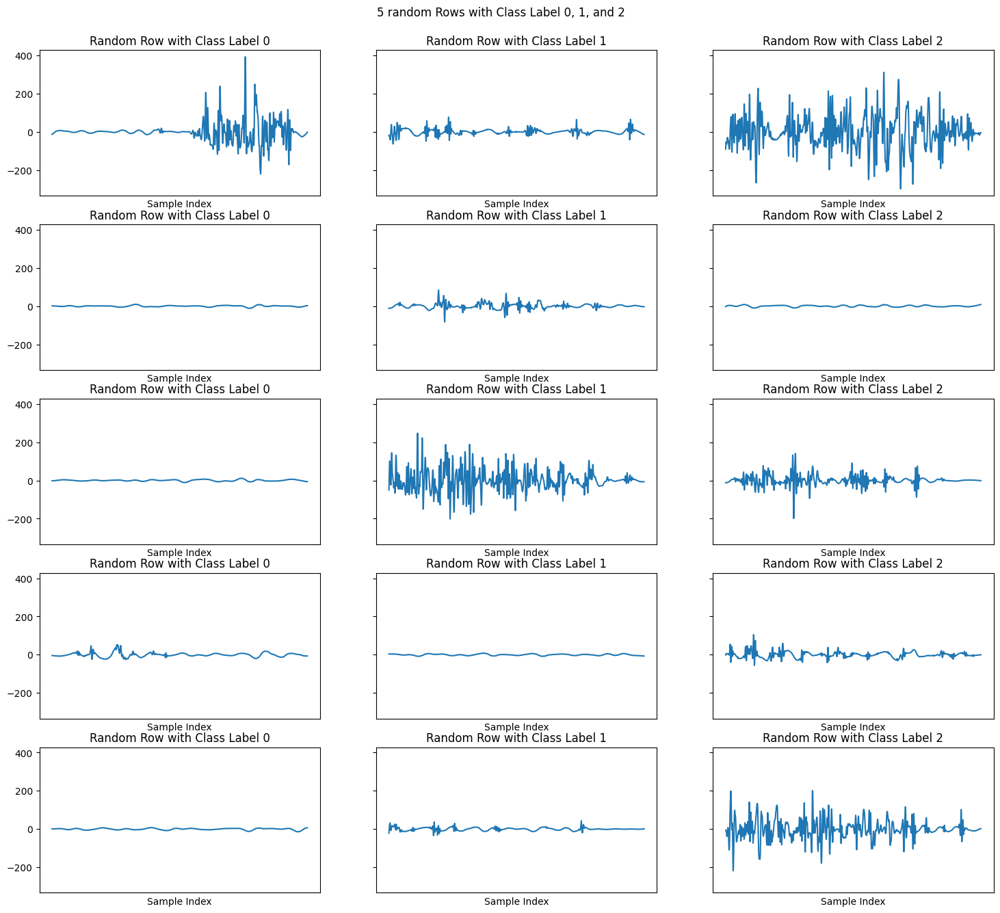

In [5]:
import random
# Create a figure for the subplots
# plt.figure(figsize=(18, 10))  # Increase figure size for better visibility

# Create a figure for the subplots
fig, axs = plt.subplots(5, 3, figsize=(18, 16), sharey=True, sharex=True)  # Share Y-axis across all subplots

for row in range(5):
    for idx, label in enumerate([0, 1, 2]):
        # Filter and sample data
        filtered_df = l_ear_features_df[l_ear_features_df["class_label"] == label]
        random_rows = filtered_df.sample(n=1)

        # Plot on the respective subplot
        for i in range(random_rows.shape[0]):
            axs[row, idx].plot(random_rows.iloc[i, 2:1000], label=f'Row {i+1}')

        # axs[row,idx].legend()
        axs[row,idx].set_title(f'Random Row with Class Label {label}')
        axs[row,idx].set_xlabel('Sample Index')
        axs[row,idx].set_xticks([])  # Hide x-axis ticks

plt.suptitle("5 random Rows with Class Label 0, 1, and 2", y=0.92)  # Set the title for the entire figure
plt.show()


## Try ML classification models

### [NOT USED] Grid search in SVM for C, gamma and kernel with **EMG signal and characteristics** as features

(makes no sense to use EMG signal)

In [2]:
l_ear_features_df, r_ear_features_df = process_xdf("Data/s2/sub-AM001_s2_task6.xdf") # Process data from session 2
X = l_ear_features_df.iloc[:, 2:] # Use all columns except the first two
y = l_ear_features_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Define the model
svm_model = svm.SVC()

# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100],  # Note: Add more values to explore
    'gamma': [1, 0.1, 0.01, 0.001],  # Note: Add more values or use 'scale'/'auto'
    'kernel': ['rbf', 'sigmoid']  # Note: Include 'linear' if computation is feasible
}

# Setup GridSearchCV
grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Perform the grid search on the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy found: ", grid_search.best_score_)

# Optionally, evaluate the best model found on the test set
best_model = grid_search.best_estimator_
test_accuracy = best_model.score(X_test, y_test)
print("Test set accuracy of the best model: ", test_accuracy)

Data in folder Data/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.
Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   5.4s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   5.3s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   5.2s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   5.2s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   5.3s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   1.8s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   1.8s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   1.8s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   1.8s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   1.8s
[CV] END ...............

Best parameters found:  {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}

Best accuracy found:  0.6588593141445805

Test set accuracy of the best model:  0.6519823788546255

### Grid search in SVM for C, gamma and kernel with only **characteristics** as features

In [2]:
from sklearn.model_selection import GridSearchCV

l_ear_features_df, r_ear_features_df = process_xdf("Data/AM001/s2/sub-AM001_s2_task6.xdf")
X = l_ear_features_df.iloc[:, 1002:].values # Use only the features extracted from the EMG data
y = l_ear_features_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Stardardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the model
svm_model = svm.SVC(class_weight='balanced')

# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100, 1000],  # Note: Add more values to explore
    'gamma': [1, 0.5, 0.1, 0.01, 0.001],  # Note: Add more values or use 'scale'/'auto'
    'kernel': ['rbf', 'sigmoid']  # Note: Include 'linear' if computation is feasible
}

# Setup GridSearchCV
grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Perform the grid search on the training data
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy found: ", grid_search.best_score_)

# Optionally, evaluate the best model found on the test set
best_model = grid_search.best_estimator_
test_accuracy = best_model.score(X_test_scaled, y_test)
print("Test set accuracy of the best model: ", test_accuracy)

Data in folder Data/AM001/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.6s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.4s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.3s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.4s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.4s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.3s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.3s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.4s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.4s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.4s
[CV] END .........

Best parameters found:  {'C': 10, 'gamma': 1, 'kernel': 'rbf'}

Best accuracy found:  0.6026491878027928

Test set accuracy of the best model:  0.5859030837004405

Cross-validation score, MEAN: 0.6026491878027928 with STD: 0.00762796690136294
              precision    recall  f1-score   support

         0.0       0.74      0.76      0.75       607
         1.0       0.23      0.23      0.23       167
         2.0       0.27      0.25      0.26       134

    accuracy                           0.59       908
   macro avg       0.42      0.41      0.41       908
weighted avg       0.58      0.59      0.58       908



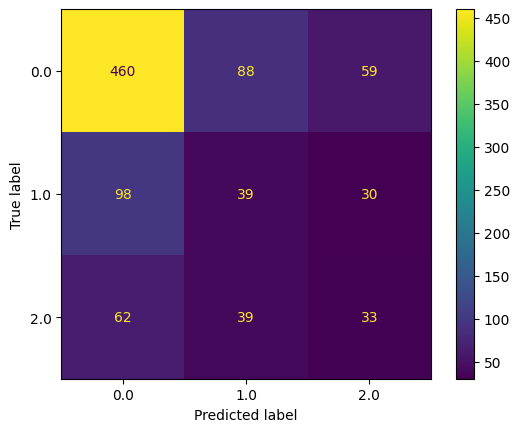

In [3]:
# Analyze the model performance

svc_model = svm.SVC(C=10, gamma=1, kernel='rbf', class_weight='balanced')
svc_model.fit(X_train_scaled, y_train)

cv_score = cross_val_score(svc_model, X_train_scaled, y_train, cv=5)
print("Cross-validation score, MEAN:", cv_score.mean(), "with STD:", cv_score.std())

y_pred = svc_model.predict(X_test_scaled)
print(classification_report(y_test, y_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=svc_model.classes_)
disp.plot()
plt.show()



### PCA and SVM on principal components

In [4]:
from sklearn.decomposition import PCA

l_ear_features_df, r_ear_features_df = process_xdf("Data/AM001/s2/sub-AM001_s2_task6.xdf")
X = l_ear_features_df.iloc[:, 1002:].values # Use only the features extracted from the EMG data
y = l_ear_features_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
# print(X_train[0])

Data in folder Data/AM001/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.


In [5]:
# Standardize the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Apply transform to train and test
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
# print(X_train[0])

In [6]:
# Apply PCA
pca = PCA(0.95)
pca.fit(X_train) # Fit PCA on standardized training data
print(pca.n_components_) # Print the number of components that explain 95% of the variance

X_train_pca = pca.transform(X_train) # Transform the training data
X_test_pca = pca.transform(X_test) # Transform the test data
print(X_train.shape)
print(X_train_pca.shape)

5
(3629, 18)
(3629, 5)


In [7]:
most_important = [np.abs(pca.components_[i]).argmax() for i in range(pca.n_components_)]
feature_names = l_ear_features_df.columns[1002:]
most_important_names = [feature_names[most_important[i]] for i in range(pca.n_components_)]
print(most_important_names)
print(most_important)

['DASDV', 'WAMP', 'FR', 'PKF', 'PKF']
[7, 9, 11, 16, 16]


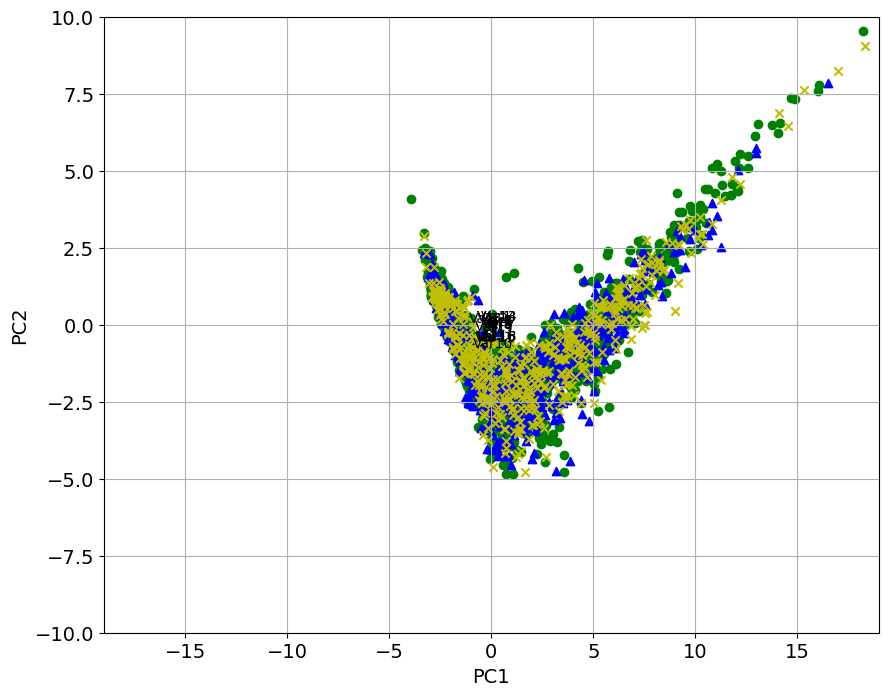

In [8]:
# Biplot
def biplot(score, coeff , y):
    '''
    Author: Serafeim Loukas, serafeim.loukas@epfl.ch
    Inputs:
       score: the projected data
       coeff: the eigenvectors (PCs)
       y: the class labels
   '''
    xs = score[:,0] # projection on PC1
    ys = score[:,1] # projection on PC2
    n = coeff.shape[0] # number of variables
    plt.figure(figsize=(10,8), dpi=100)
    classes = np.unique(y)
    colors = ['g','b','y']
    markers=['o','^','x']
    for s,l in enumerate(classes):
        plt.scatter(xs[y==l],ys[y==l], c = colors[s], marker=markers[s]) # color based on group
    for i in range(n):
        #plot as arrows the variable scores (each variable has a score for PC1 and one for PC2)
        plt.arrow(0, 0, coeff[i,0], coeff[i,1], color = 'k', alpha = 0.9,linestyle = '-',linewidth = 1.5, overhang=0.2)
        plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'k', ha = 'center', va = 'center',fontsize=10)

    plt.xlabel("PC{}".format(1), size=14)
    plt.ylabel("PC{}".format(2), size=14)
    limx= int(xs.max()) + 1
    limy= int(ys.max()) + 1
    plt.xlim([-limx,limx])
    plt.ylim([-limy,limy])
    plt.grid()
    plt.tick_params(axis='both', which='both', labelsize=14)

biplot(X_train_pca[:, 0:2], np.transpose(pca.components_[0:2, :]), y_train)

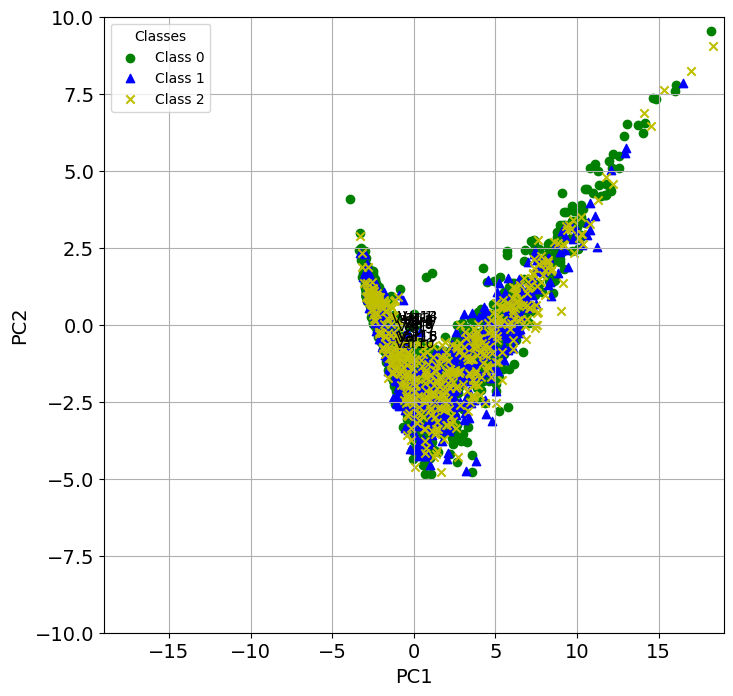

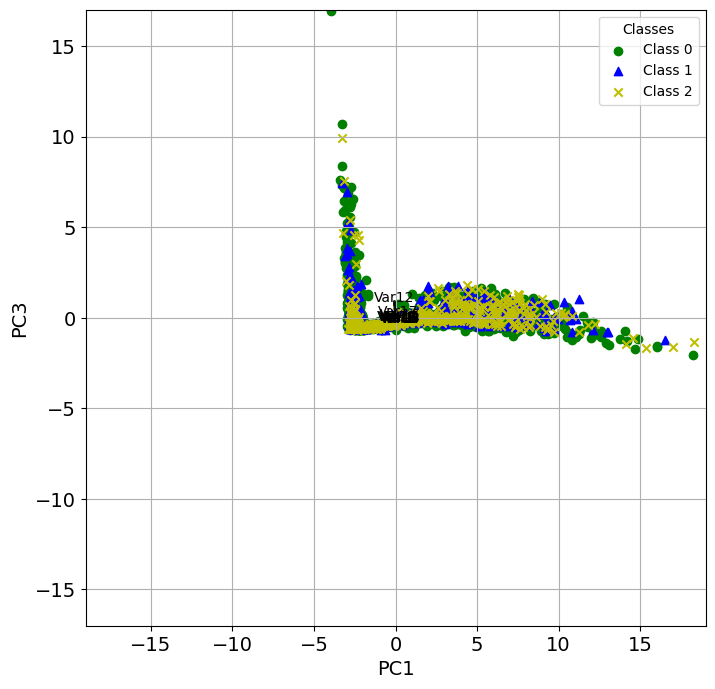

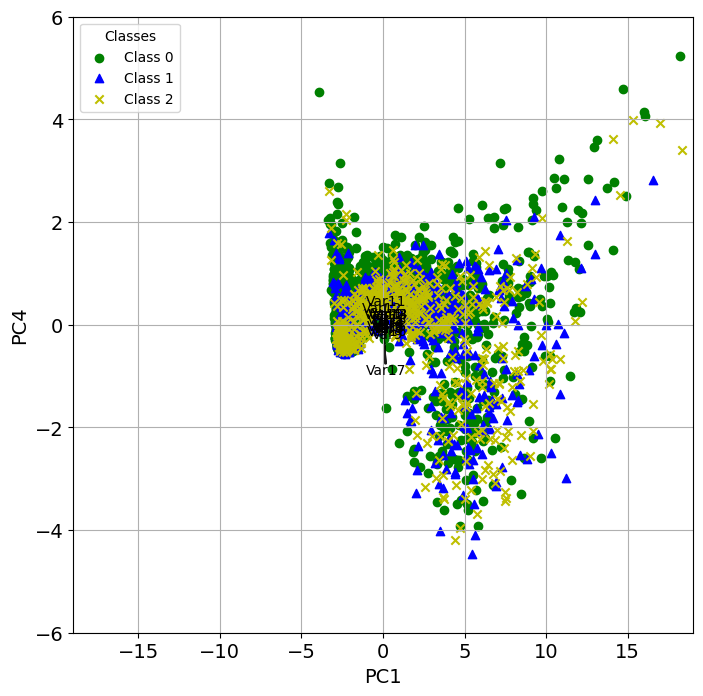

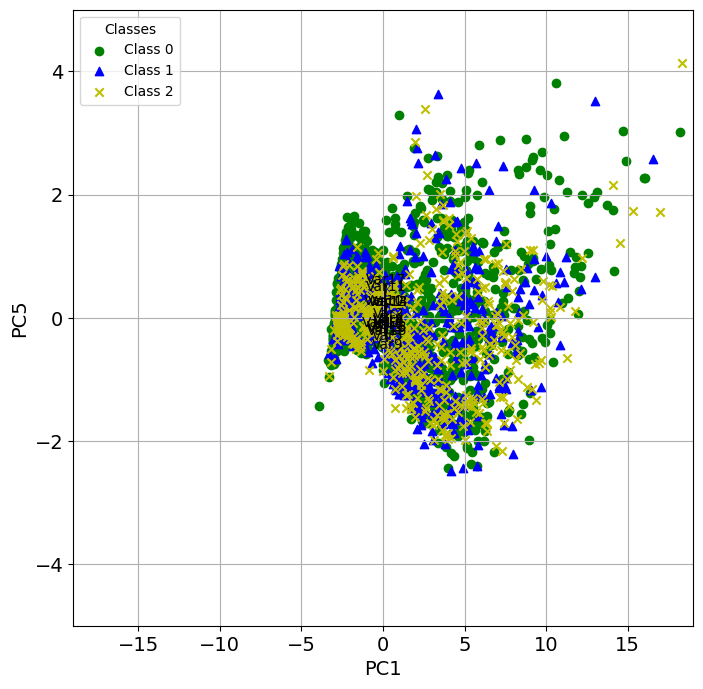

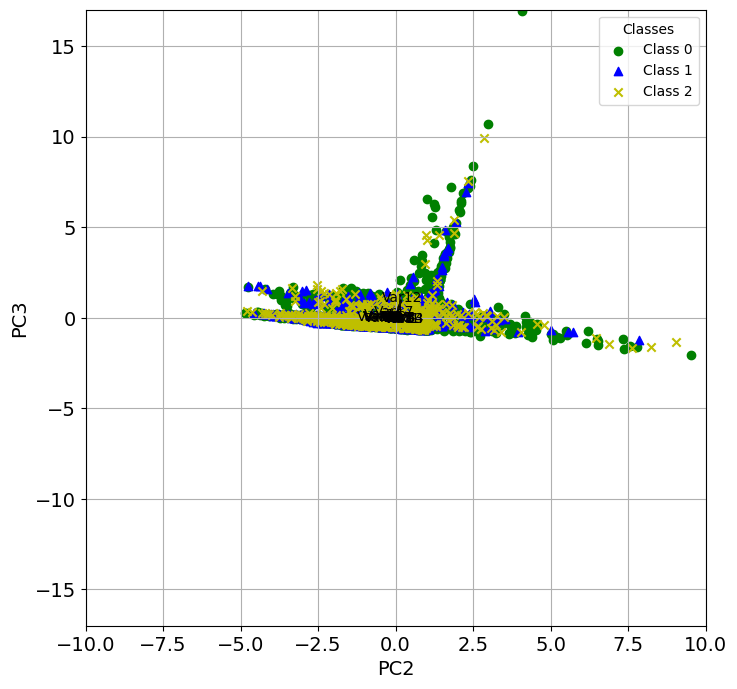

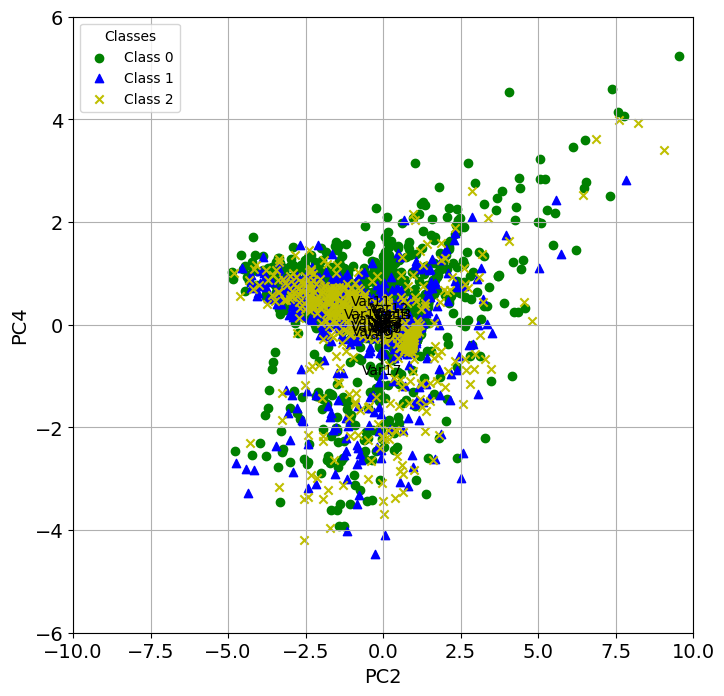

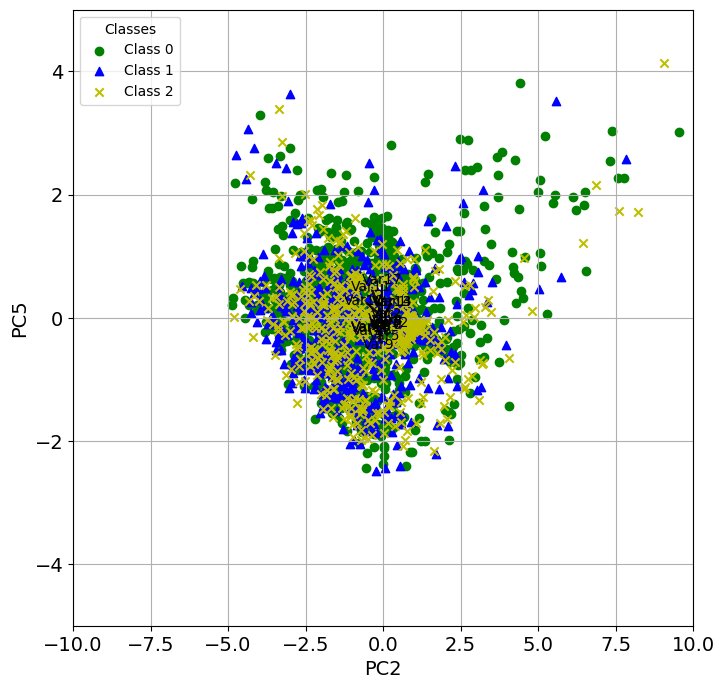

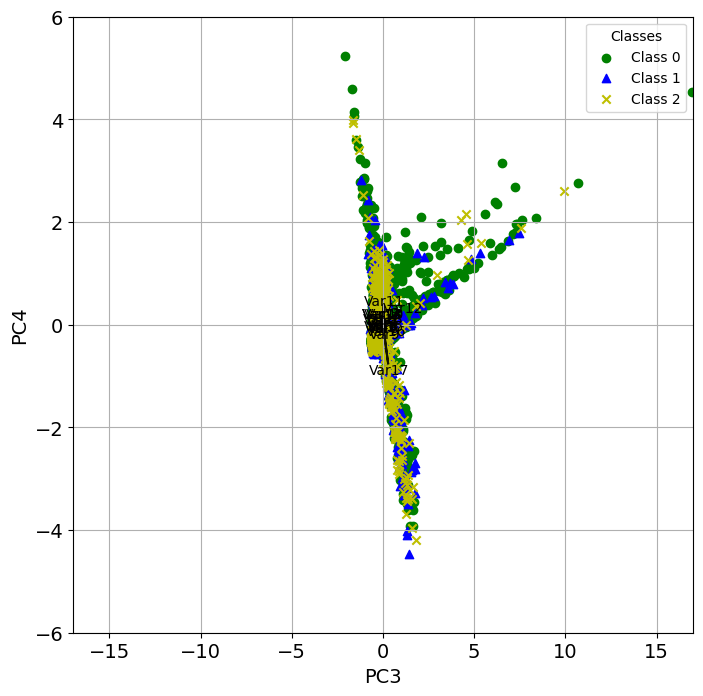

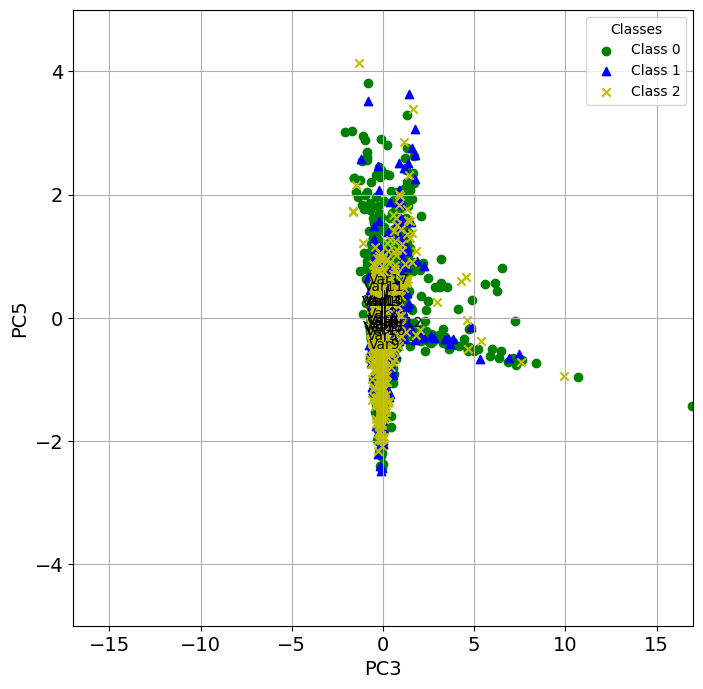

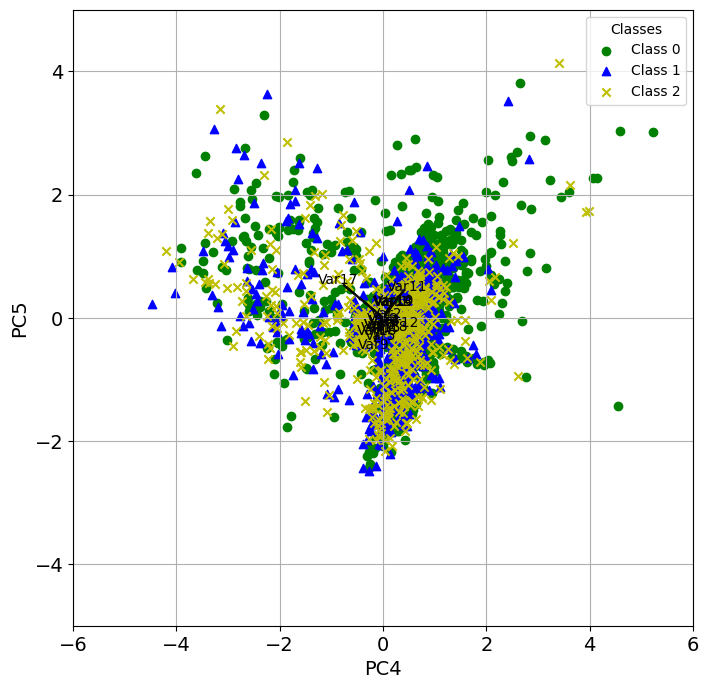

In [9]:
import matplotlib.pyplot as plt
import numpy as np

def biplot(score, coeff, y, labels, pc1=0, pc2=1):
    '''
    Inputs:
        score: the projected data (scores on principal components)
        coeff: the eigenvectors (principal components)
        y: the class labels
        labels: dictionary of class labels
        pc1: index of the first principal component to plot
        pc2: index of the second principal component to plot
    '''
    xs = score[:, pc1] # projection on PC1
    ys = score[:, pc2] # projection on PC2
    n = coeff.shape[0] # number of variables

    plt.figure(figsize=(8,8), dpi=100)
    classes = np.unique(y)
    # Optionally expand the color and marker arrays for more classes
    colors = ['g', 'b', 'y', 'r', 'c', 'm', 'orange', 'purple']
    markers = ['o', '^', 'x', 's', 'p', '*', 'd', '<']

    # Scatter plot and legend mapping
    for s, l in enumerate(classes):
        plt.scatter(xs[y == l], ys[y == l], color=colors[s % len(colors)], marker=markers[s % len(markers)], label=labels[l])

    # Plot arrows and variable names
    for i in range(n):
        plt.arrow(0, 0, coeff[i, pc1], coeff[i, pc2], color='k', alpha=0.9, linestyle='-', linewidth=1.5, overhang=0.2)
        plt.text(coeff[i, pc1] * 1.15, coeff[i, pc2] * 1.15, "Var" + str(i+1), color='k', ha='center', va='center', fontsize=10)

    plt.xlabel(f"PC{pc1+1}", size=14)
    plt.ylabel(f"PC{pc2+1}", size=14)
    limx = int(max(abs(xs.max()), abs(xs.min()))) + 1
    limy = int(max(abs(ys.max()), abs(ys.min()))) + 1
    plt.xlim([-limx, limx])
    plt.ylim([-limy, limy])
    plt.grid()
    plt.tick_params(axis='both', which='both', labelsize=14)
    plt.legend(loc='best', title="Classes")
    plt.show()

# Example of class labels
class_labels = {0: "Class 0", 1: "Class 1", 2: "Class 2"}
# Usage example: Plotting PC1 vs PC3
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=1)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=2)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=3)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=4)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=1, pc2=2)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=1, pc2=3)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=1, pc2=4)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=2, pc2=3)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=2, pc2=4)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=3, pc2=4)




In [10]:
pca.explained_variance_ratio_

array([0.69655858, 0.14244783, 0.04964257, 0.04283199, 0.02908489])

Score: 0.5649779735682819
Cross-validation score, MEAN: 0.580326398784079 with STD: 0.009349130366899843
              precision    recall  f1-score   support

         0.0       0.73      0.74      0.73       568
         1.0       0.30      0.23      0.26       190
         2.0       0.27      0.32      0.29       150

    accuracy                           0.56       908
   macro avg       0.43      0.43      0.43       908
weighted avg       0.56      0.56      0.56       908



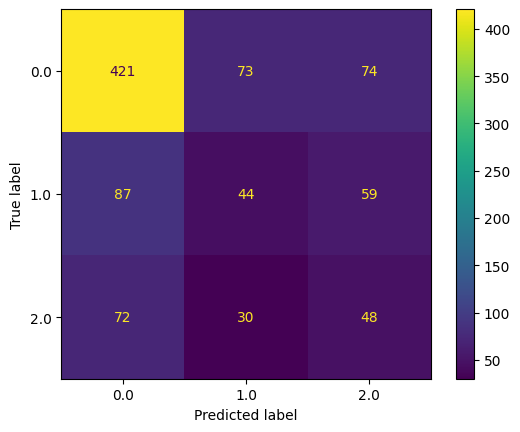

In [12]:
# Apply SVM on PCA data

svm_model = svm.SVC(class_weight="balanced", C= 10, gamma= 1, kernel="rbf")

svm_model.fit(X_train_pca, y_train)
print("Score:", svm_model.score(X_test_pca, y_test))
cv_score = cross_val_score(svm_model, X_train_pca, y_train, cv=5)
print("Cross-validation score, MEAN:", cv_score.mean(), "with STD:", cv_score.std())

# Display confusion matrix
y_pred = svm_model.predict(X_test_pca)
print(classification_report(y_test, y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=svm_model.classes_)
disp.plot()
plt.show()


### [NOT USED] SVM with **linear kernel** DO NOT RUN

In [2]:
# l_ear_features_df, r_ear_features_df = process_xdf("Data/s2/sub-AM001_s2_task6.xdf")
# X = l_ear_features_df.iloc[:, 1002:] # Use only the features extracted from the EMG data
# y = l_ear_features_df['class_label'].values

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# # Define the model
# svm_model = svm.SVC(kernel="linear", verbose=2)

# # Perform the grid search on the training data
# svm_model.fit(X_train, y_train)
# print("Score:", svm_model.score(X_test, y_test))

# # svm_score = cross_val_score(svm_model, X_test, y_test, cv=5, scoring="accuracy")
# # print("Precision with SVM CV: %0.2f (+/- %0.2f)" % (svm_score.mean(), svm_score.std() * 2))


Data in folder Data/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.
[LibSVM]

### [NOT USED] Grid search for Random Forests with **EMG signal and characteristics** as features

(Makes no sense to train on sEMG data if we have features)

In [4]:
l_ear_features_df, r_ear_features_df = process_xdf("Data/s2/sub-AM001_s2_task6.xdf")
X = l_ear_features_df.iloc[:, 2:] # Use all columns except the first two
y = l_ear_features_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

rf_model = RandomForestClassifier()

# Define the parameter grid to search over
param_grid = {
    'n_estimators': [100, 200, 500],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at every split
    'max_depth': [10, 50, None],  # Maximum number of levels in tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]  # Method of selecting samples for training each tree
}

# Setup GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Perform the grid search on the training data
grid_search_rf.fit(X_train, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search_rf.best_params_)
print("Best accuracy found: ", grid_search_rf.best_score_)

# Optionally, evaluate the best model found on the test set
best_rf_model = grid_search_rf.best_estimator_
test_accuracy = best_rf_model.score(X_test, y_test)
print("Test set accuracy of the best model: ", test_accuracy)

Data in folder Data/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.
Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.6s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.5s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.5s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.5s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   3.5s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   7.1s
[CV] END bootstr

### Grid search for Random Forests with only **characteristics** as features

In [13]:
# This code runs for 20 minutes

l_ear_features_df, r_ear_features_df = process_xdf("Data/AM001/s2/sub-AM001_s2_task6.xdf")
X = l_ear_features_df.iloc[:, 1002:].values # Use only the features extracted from the EMG data
y = l_ear_features_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Standardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

rf_model = RandomForestClassifier(class_weight='balanced') # Use balanced class weights to account for class imbalance

# Define the parameter grid to search over
param_grid = {
    'n_estimators': [100, 200, 500],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at every split
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]  # Method of selecting samples for training each tree
}

# Setup GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Perform the grid search on the training data
grid_search_rf.fit(X_train_scaled, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search_rf.best_params_)
print("Best accuracy found: ", grid_search_rf.best_score_)

# Optionally, evaluate the best model found on the test set
best_rf_model = grid_search_rf.best_estimator_
test_accuracy = best_rf_model.score(X_test_scaled, y_test)
print("Test set accuracy of the best model: ", test_accuracy)

Data in folder Data/AM001/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.
Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimato

Best parameters found:  {'bootstrap': True, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

Best accuracy found:  0.6687785693929895

Test set accuracy of the best model:  0.6321585903083701

Cross-validation score, MEAN: 0.6599608625439346 with STD: 0.009537303363419113
              precision    recall  f1-score   support

         0.0       0.68      0.94      0.79       570
         1.0       0.33      0.11      0.16       190
         2.0       0.45      0.17      0.25       148

    accuracy                           0.64       908
   macro avg       0.49      0.41      0.40       908
weighted avg       0.57      0.64      0.57       908



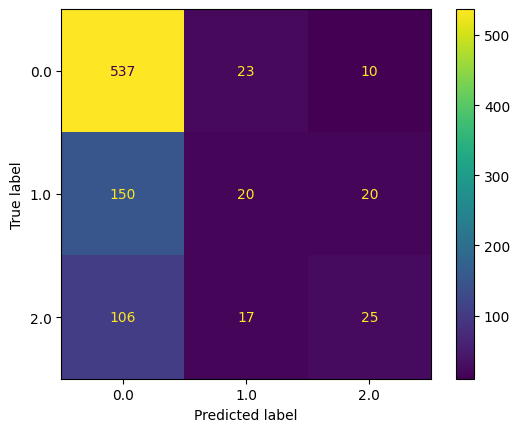

In [14]:
# Analyze the model performance

rf_model = RandomForestClassifier(bootstrap= True, max_features= "sqrt", min_samples_leaf= 1, min_samples_split= 2, n_estimators= 100)
rf_model.fit(X_train_scaled, y_train)

cv_score = cross_val_score(rf_model, X_train_scaled, y_train, cv=5)
print("Cross-validation score, MEAN:", cv_score.mean(), "with STD:", cv_score.std())

y_pred = rf_model.predict(X_test_scaled)
print(classification_report(y_test, y_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=rf_model.classes_)
disp.plot()
plt.show()


### RFECV to search for the most relevant characteristics of the signals

In [15]:
l_ear_features_df, r_ear_features_df = process_xdf("Data/AM001/s2/sub-AM001_s2_task6.xdf")
X = l_ear_features_df.iloc[:, 1002:].values
y = l_ear_features_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Standardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

estimator = RandomForestClassifier(bootstrap= True, max_features= "sqrt", min_samples_leaf= 1, min_samples_split= 2, n_estimators= 100)
selector = RFECV(estimator, step=1, cv=5, verbose=3)
selector = selector.fit(X_train_scaled, y_train)
selector.support_
selector.ranking_

Data in folder Data/AM001/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.
Fitting estimator with 2 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [16]:
# Get the name of the most important features

pd.DataFrame(X_train_scaled, columns=l_ear_features_df.columns[1002:]).columns[selector.support_]

Index(['VAR', 'RMS', 'IEMG', 'MAV', 'LOG', 'WL', 'ACC', 'DASDV', 'ZC', 'WAMP',
       'MYOP', 'FR', 'MNP', 'TP', 'MNF', 'MDF', 'PKF', 'WENT'],
      dtype='object')

Important columns after RFECV: All

Cross-validation score, MEAN: 0.6555493492922959 with STD: 0.006513130320707297
              precision    recall  f1-score   support

         0.0       0.70      0.92      0.79       597
         1.0       0.30      0.16      0.21       169
         2.0       0.28      0.06      0.10       142

    accuracy                           0.64       908
   macro avg       0.43      0.38      0.37       908
weighted avg       0.56      0.64      0.57       908



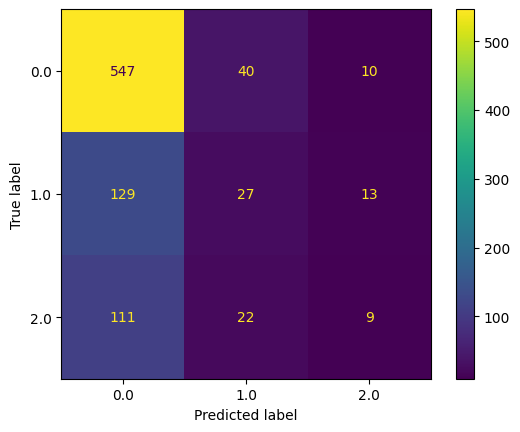

In [64]:
X_train_selected = X_train_scaled[:, selector.support_]
X_test_selected = X_test_scaled[:, selector.support_]

# Analyze the model performance

selec_model = RandomForestClassifier(bootstrap= True, max_depth= 50, max_features= "auto", min_samples_leaf= 1, min_samples_split= 2, n_estimators= 200)
selec_model.fit(X_train_selected, y_train)

cv_score = cross_val_score(selec_model, X_train_selected, y_train, cv=5)
print("Cross-validation score, MEAN:", cv_score.mean(), "with STD:", cv_score.std())

y_pred = selec_model.predict(X_test_selected)
print(classification_report(y_test, y_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=selec_model.classes_)
disp.plot()
plt.show()




## APPROACH: remove some class 0 samples

The results above suggest that the models may not be able to perform because the majority of the data is of class 0, so the models would classify everything as 0 and still get "good" results.

To avoid it, I will remove 70% of the data labeled as class 0 as there are:
- 2983 datapoints of class 0
- 876 datapoints of class 1
- 687 datapoints of class 2

In [6]:
l_ear_features_df, r_ear_features_df = process_xdf("Data/AM001/s2/sub-AM001_s2_task6.xdf")

Data in folder Data/AM001/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.


In [4]:
# One way to pick 50% of the rows with class_label 0

# import random
# # Set the random seed for reproducibility
# random.seed(42)

# # Get the indices of rows where class_label is 0
# zero_indices = l_ear_features_df[l_ear_features_df['class_label'] == 0].index

# # Calculate the number of rows to remove (50% of the total number of rows with class_label 0)
# num_rows_to_remove = int(len(zero_indices) * 0.5)

# # Randomly select the indices to remove
# rows_to_remove = random.sample(zero_indices.tolist(), num_rows_to_remove)

# # Remove the selected rows
# l_ear_features_df = l_ear_features_df.drop(rows_to_remove)

# # Reset the index of the DataFrame
# l_ear_features_df = l_ear_features_df.reset_index(drop=True)

# display(l_ear_features_df)


In [7]:
# Pick 70% of the rows with class_label 0

# Filter the rows where class_label is 0
class_0_df = l_ear_features_df[l_ear_features_df['class_label'] == 0]

# Randomly sample 50% of these rows
class_0_sampled_df = class_0_df.sample(frac=0.3) # Remove 70% of the rows with class 0

# Filter the rows where class_label is not 0
non_class_0_df = l_ear_features_df[l_ear_features_df['class_label'] != 0]

# Concatenate the down-sampled class 0 DataFrame with the non-class 0 DataFrame
balanced_df = pd.concat([class_0_sampled_df, non_class_0_df])

# Shuffle the rows of the DataFrame
balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)
# display(balanced_df)

class_counts = balanced_df['class_label'].value_counts()
print(class_counts)


0.0    895
1.0    867
2.0    687
Name: class_label, dtype: int64


### Random Forests in balanced dataset

Apply RF with the same args from the last grid search

Cross-validation score, MEAN: 0.44511456756615686 with STD: 0.017755238204454394
              precision    recall  f1-score   support

         0.0       0.53      0.59      0.56       177
         1.0       0.46      0.42      0.44       176
         2.0       0.42      0.40      0.41       137

    accuracy                           0.48       490
   macro avg       0.47      0.47      0.47       490
weighted avg       0.47      0.48      0.47       490



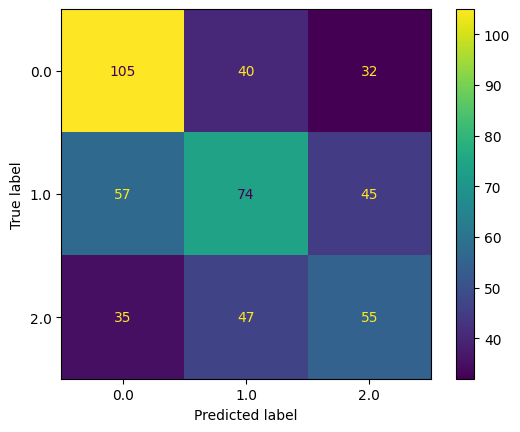

In [21]:
X = balanced_df.iloc[:, 1002:].values
y = balanced_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Standardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

rf_model = RandomForestClassifier(bootstrap= True, max_features= "sqrt", min_samples_leaf= 1, min_samples_split= 2, n_estimators= 100)
rf_model.fit(X_train_scaled, y_train)

cv_score = cross_val_score(rf_model, X_train_scaled, y_train, cv=5)
print("Cross-validation score, MEAN:", cv_score.mean(), "with STD:", cv_score.std())

y_pred = rf_model.predict(X_test_scaled)
print(classification_report(y_test, y_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=rf_model.classes_)
disp.plot()
plt.show()

I believe that with a balanced dataset we can test better the models and their performances, although we loose information. If I don't get better results testing different models and hyperparameters with this balanced dataset I will resort to join all the sessions

### Grid search in SVM with balanced dataset

In [23]:
X = balanced_df.iloc[:, 1002:].values # Use only the features extracted from the EMG data
y = balanced_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Stardardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the model
svm_model = svm.SVC()

# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100, 1000],  # Note: Add more values to explore
    'gamma': [1, 0.5, 0.1, 0.01, 0.001, "scale", "auto"],  # Note: Add more values or use 'scale'/'auto'
    'kernel': ['rbf', 'sigmoid']  # Note: Include 'linear' if computation is feasible
}

# Setup GridSearchCV
grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Perform the grid search on the training data
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy found: ", grid_search.best_score_)

# Optionally, evaluate the best model found on the test set
best_model = grid_search.best_estimator_
test_accuracy = best_model.score(X_test_scaled, y_test)
print("Test set accuracy of the best model: ", test_accuracy)

Fitting 5 folds for each of 70 candidates, totalling 350 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.5, kernel=rbf; total time=   0.0s
[CV] END .......................C=0.1, gamma=0.

              precision    recall  f1-score   support

         0.0       0.53      0.64      0.58       178
         1.0       0.43      0.49      0.46       179
         2.0       0.38      0.22      0.28       133

    accuracy                           0.47       490
   macro avg       0.45      0.45      0.44       490
weighted avg       0.46      0.47      0.45       490



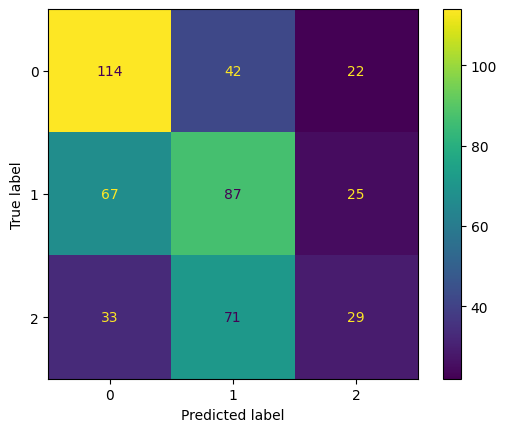

In [24]:
# Get predictions for the test set using the best model
y_pred = best_model.predict(X_test_scaled)

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm).plot()

# Display the classification report
report = classification_report(y_test, y_pred)
print(report)


### Grid search for Random Forests with balanced dataset

In [25]:
X = balanced_df.iloc[:, 1002:].values # Use only the features extracted from the EMG data
y = balanced_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Standardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

rf_model = RandomForestClassifier()

# Define the parameter grid to search over
param_grid = {
    'n_estimators': [100, 200, 500],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at every split
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]  # Method of selecting samples for training each tree
}

# Setup GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Perform the grid search on the training data
grid_search_rf.fit(X_train_scaled, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search_rf.best_params_)
print("Best accuracy found: ", grid_search_rf.best_score_)

# Optionally, evaluate the best model found on the test set
best_rf_model = grid_search_rf.best_estimator_
test_accuracy = best_rf_model.score(X_test_scaled, y_test)
print("Test set accuracy of the best model: ", test_accuracy)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2

              precision    recall  f1-score   support

         0.0       0.53      0.57      0.55       182
         1.0       0.41      0.42      0.41       175
         2.0       0.36      0.32      0.34       133

    accuracy                           0.45       490
   macro avg       0.43      0.43      0.43       490
weighted avg       0.44      0.45      0.44       490



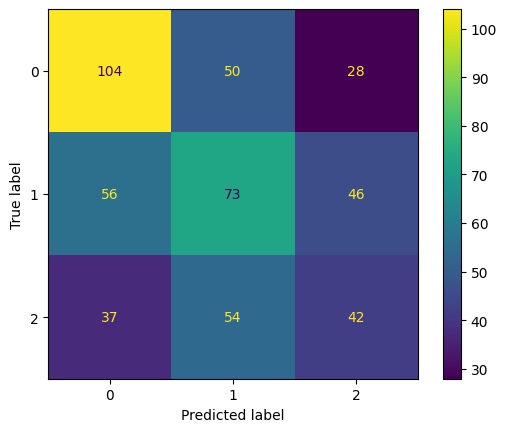

In [27]:
# Get predictions for the test set using the best model
y_pred = best_rf_model.predict(X_test_scaled)

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm).plot()

# Display the classification report
report = classification_report(y_test, y_pred)
print(report)


### LDA on balanced dataset

Score: 0.4775510204081633
Cross validation score: 0.47832844000782937 with standard deviation of 0.04194403329719783
              precision    recall  f1-score   support

         0.0       0.51      0.69      0.59       169
         1.0       0.45      0.45      0.45       181
         2.0       0.45      0.26      0.33       140

    accuracy                           0.48       490
   macro avg       0.47      0.47      0.45       490
weighted avg       0.47      0.48      0.46       490



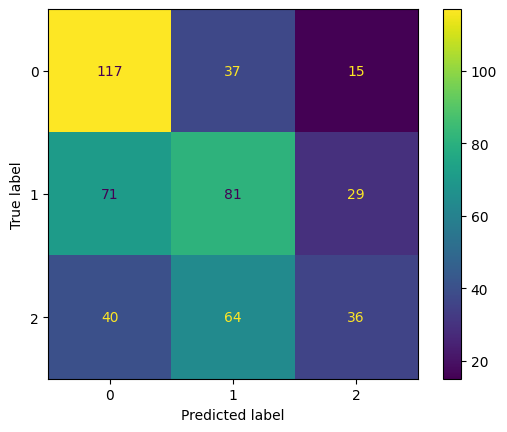

In [40]:
X = balanced_df.iloc[:, 1002:].values # Use only the features extracted from the EMG data
y = balanced_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Standardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the model
lda_model = LinearDiscriminantAnalysis()

# Perform the grid search on the training data
lda_model.fit(X_train_scaled, y_train)
print("Score:", lda_model.score(X_test_scaled, y_test))
cv_score = cross_val_score(lda_model, X_train_scaled, y_train, cv=15)
print("Cross validation score:", cv_score.mean(), "with standard deviation of", cv_score.std())

# Get predictions for the test set using the best model
y_pred = lda_model.predict(X_test_scaled)

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm).plot()

# Display the classification report
report = classification_report(y_test, y_pred)
print(report)

<Figure size 640x480 with 0 Axes>

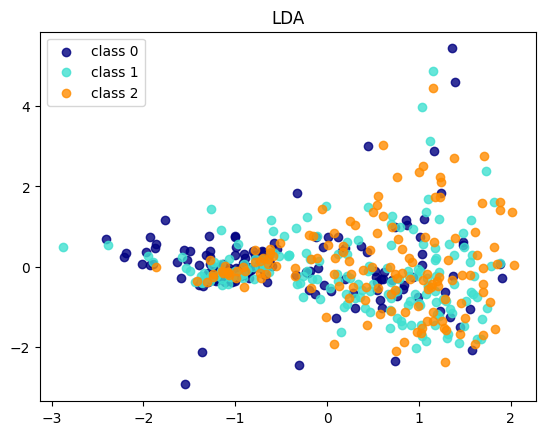

In [41]:
X_r2 = lda_model.transform(X_test_scaled)
target_names = ['class 0', 'class 1', 'class 2']
plt.figure()
colors = ["navy", "turquoise", "darkorange"]

plt.figure()
for color, i, target_name in zip(colors, [0, 1, 2], target_names):
    plt.scatter(
        X_r2[y_test == i, 0], X_r2[y_test == i, 1], alpha=0.8, color=color, label=target_name
    )
plt.legend(loc="best", shadow=False, scatterpoints=1)
plt.title("LDA")

plt.show()

### PCA on balanced dataset

In [42]:
X = balanced_df.iloc[:, 1002:].values  # Features from the EMG data
y = balanced_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform training data
X_test_scaled = scaler.transform(X_test)  # Transform test data using the same scaler

# Apply PCA
pca = PCA(0.95)
pca.fit(X_train_scaled)  # Fit PCA on standardized training data
print(f"Number of components (95% variance): {pca.n_components_}")

X_train_pca = pca.transform(X_train_scaled)  # Transform the training data
X_test_pca = pca.transform(X_test_scaled)  # Transform the test data
print(f"Original shape: {X_train_scaled.shape}")
print(f"Transformed shape: {X_train_pca.shape}")




Number of components (95% variance): 5
Original shape: (1959, 18)
Transformed shape: (1959, 5)


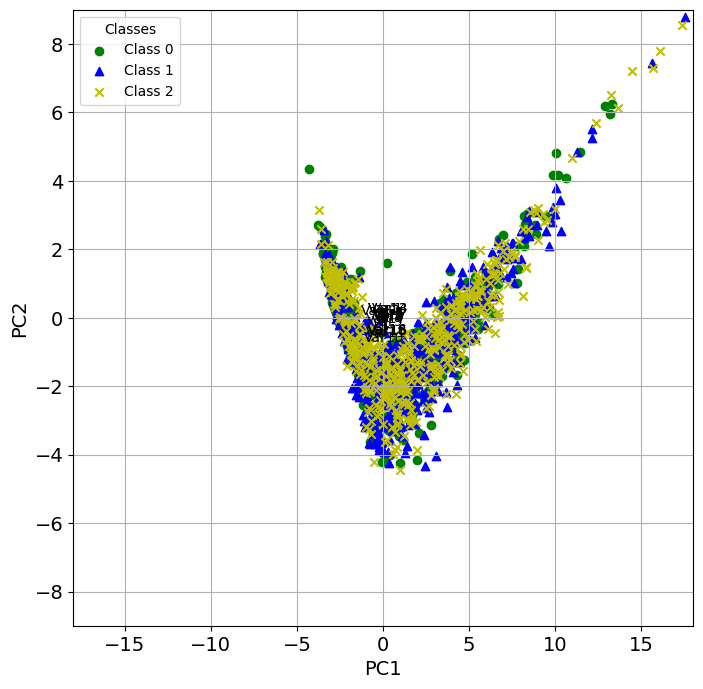

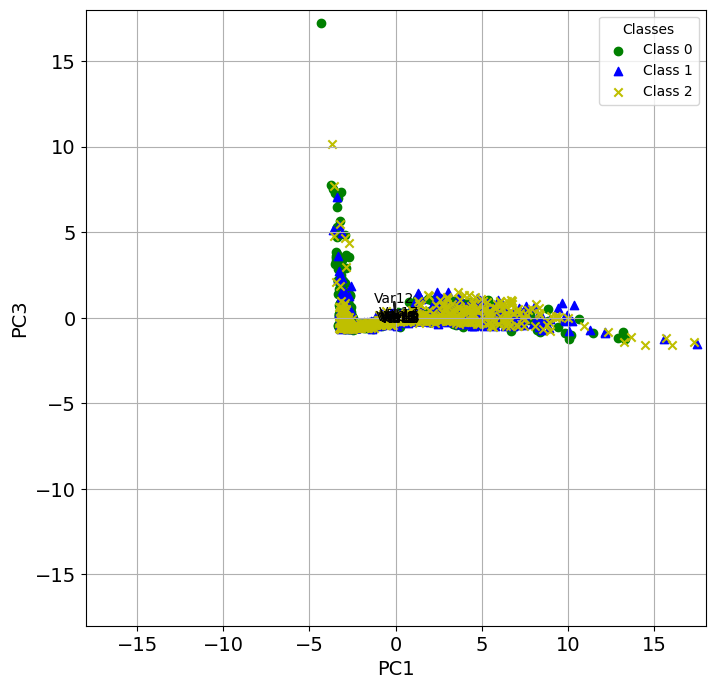

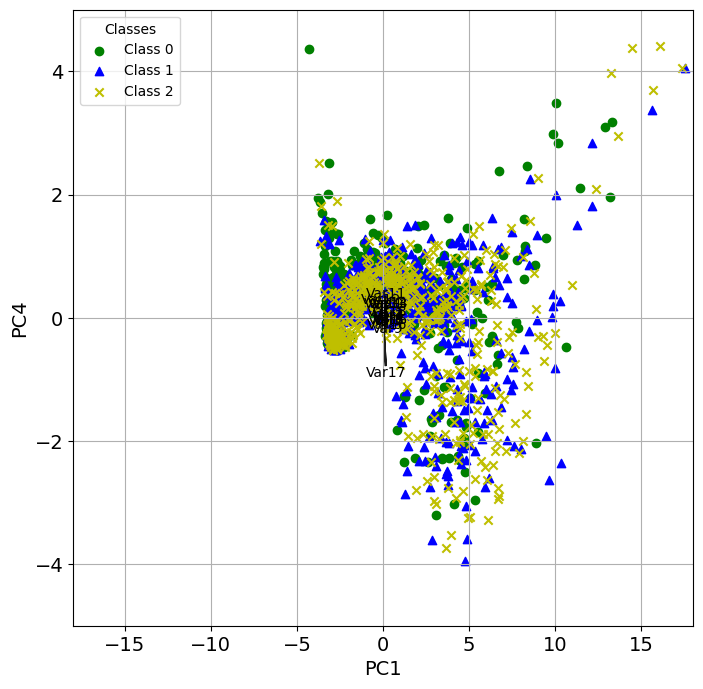

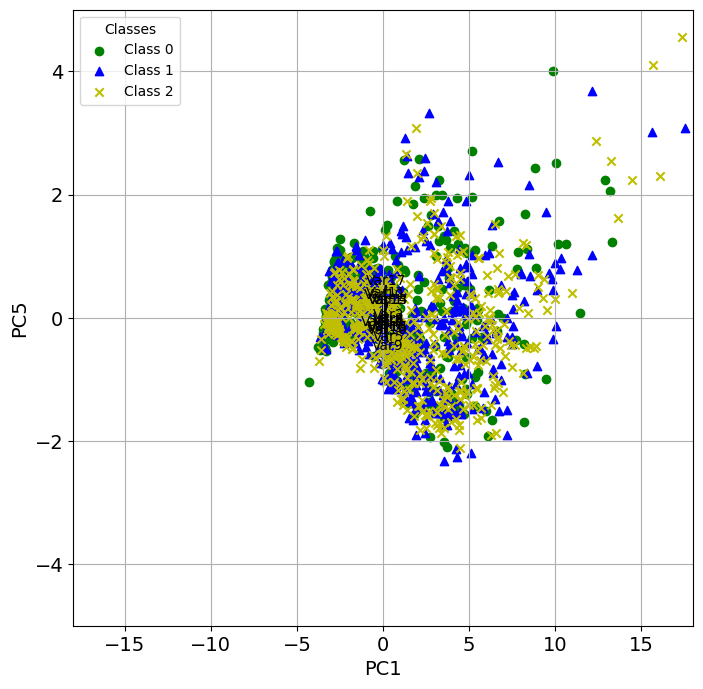

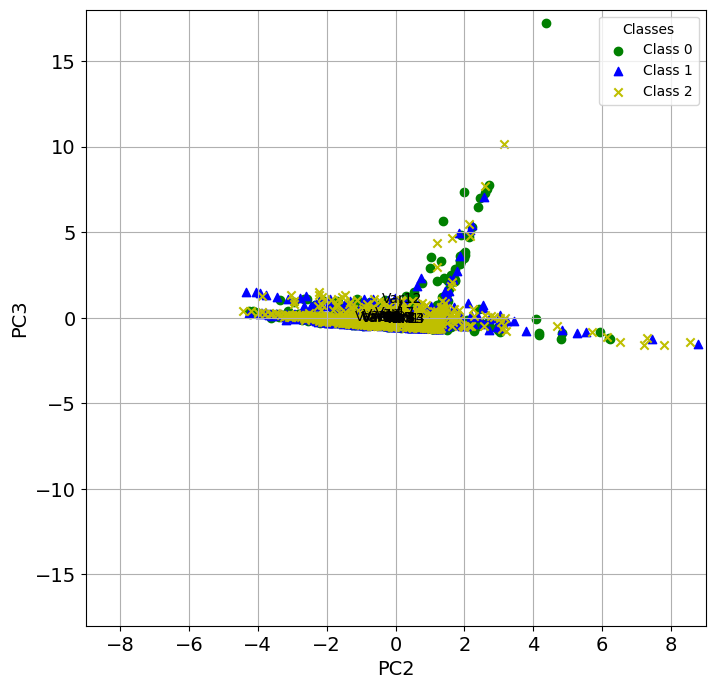

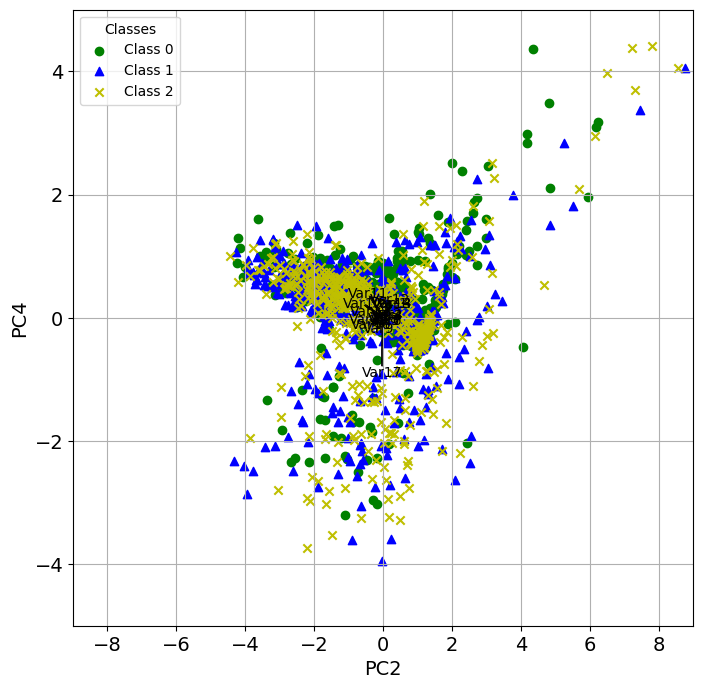

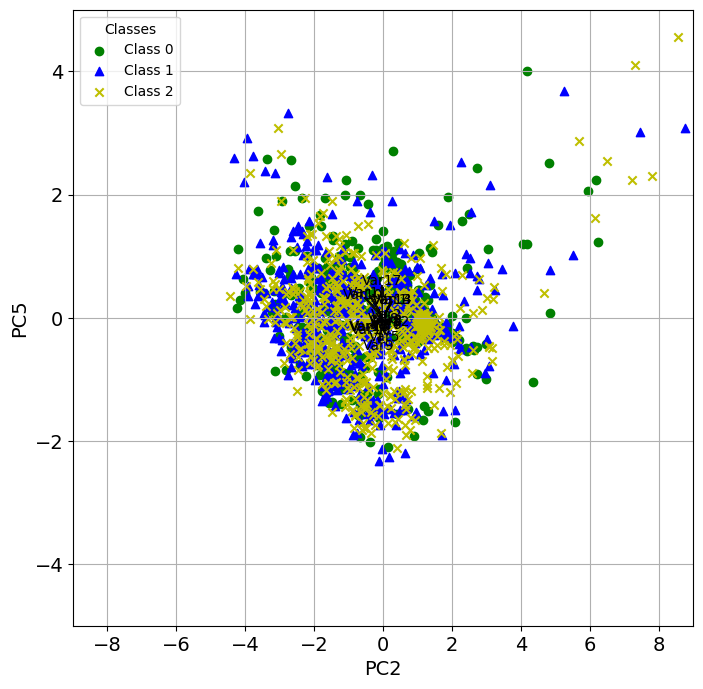

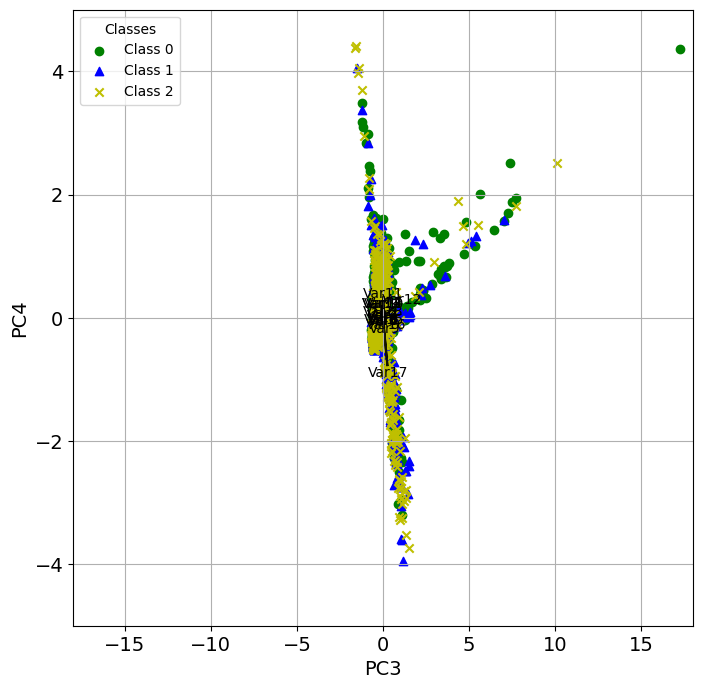

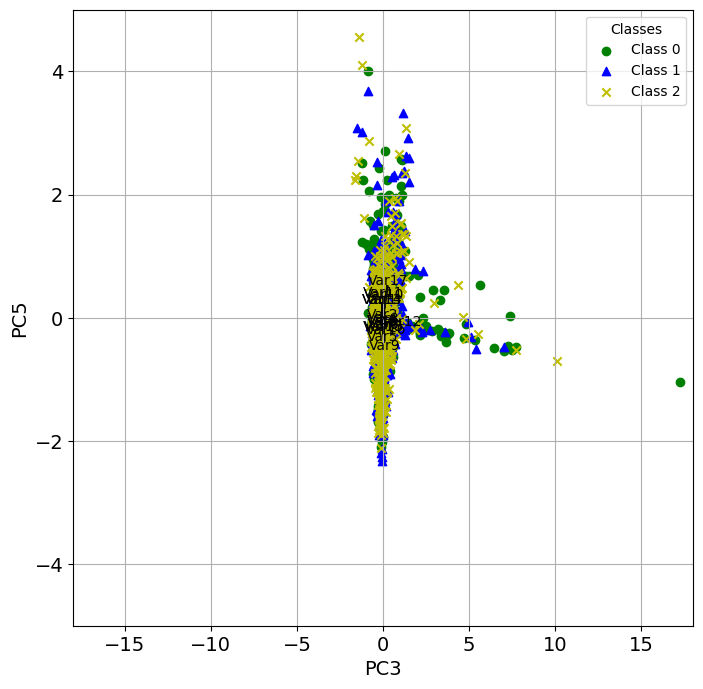

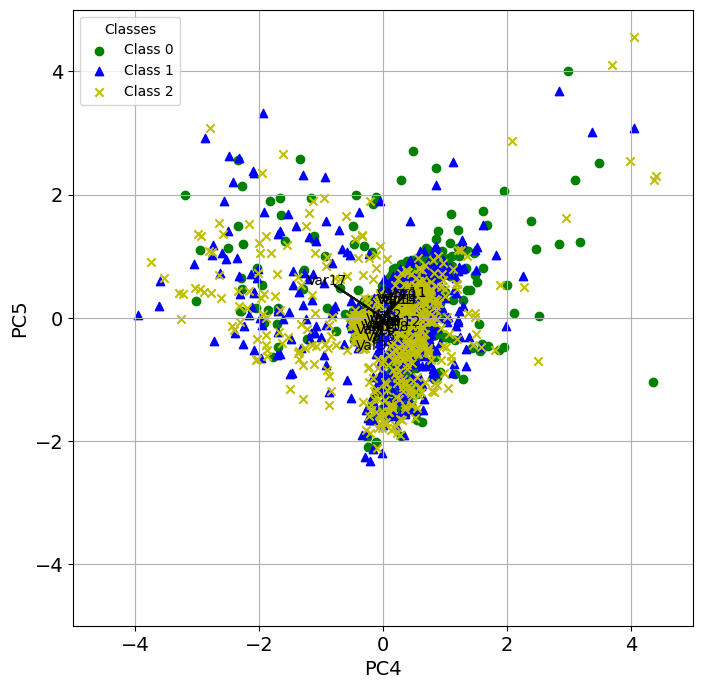

In [43]:
import matplotlib.pyplot as plt
import numpy as np

def biplot(score, coeff, y, labels, pc1=0, pc2=1):
    '''
    Inputs:
        score: the projected data (scores on principal components)
        coeff: the eigenvectors (principal components)
        y: the class labels
        labels: dictionary of class labels
        pc1: index of the first principal component to plot
        pc2: index of the second principal component to plot
    '''
    xs = score[:, pc1] # projection on PC1
    ys = score[:, pc2] # projection on PC2
    n = coeff.shape[0] # number of variables

    plt.figure(figsize=(8,8), dpi=100)
    classes = np.unique(y)
    # Optionally expand the color and marker arrays for more classes
    colors = ['g', 'b', 'y', 'r', 'c', 'm', 'orange', 'purple']
    markers = ['o', '^', 'x', 's', 'p', '*', 'd', '<']

    # Scatter plot and legend mapping
    for s, l in enumerate(classes):
        plt.scatter(xs[y == l], ys[y == l], color=colors[s % len(colors)], marker=markers[s % len(markers)], label=labels[l])

    # Plot arrows and variable names
    for i in range(n):
        plt.arrow(0, 0, coeff[i, pc1], coeff[i, pc2], color='k', alpha=0.9, linestyle='-', linewidth=1.5, overhang=0.2)
        plt.text(coeff[i, pc1] * 1.15, coeff[i, pc2] * 1.15, "Var" + str(i+1), color='k', ha='center', va='center', fontsize=10)

    plt.xlabel(f"PC{pc1+1}", size=14)
    plt.ylabel(f"PC{pc2+1}", size=14)
    limx = int(max(abs(xs.max()), abs(xs.min()))) + 1
    limy = int(max(abs(ys.max()), abs(ys.min()))) + 1
    plt.xlim([-limx, limx])
    plt.ylim([-limy, limy])
    plt.grid()
    plt.tick_params(axis='both', which='both', labelsize=14)
    plt.legend(loc='best', title="Classes")
    plt.show()

# Example of class labels
class_labels = {0: "Class 0", 1: "Class 1", 2: "Class 2"}
# Usage example: Plotting PC1 vs PC3
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=1)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=2)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=3)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=0, pc2=4)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=1, pc2=2)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=1, pc2=3)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=1, pc2=4)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=2, pc2=3)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=2, pc2=4)
biplot(X_train_pca, np.transpose(pca.components_), y_train, class_labels, pc1=3, pc2=4)




Score: 0.45102040816326533
Cross-validation score, MEAN: 0.45176548880421735 with STD: 0.01799985581650002
              precision    recall  f1-score   support

         0.0       0.38      0.49      0.43       177
         1.0       0.35      0.37      0.36       175
         2.0       0.34      0.20      0.25       138

    accuracy                           0.36       490
   macro avg       0.36      0.35      0.35       490
weighted avg       0.36      0.36      0.35       490



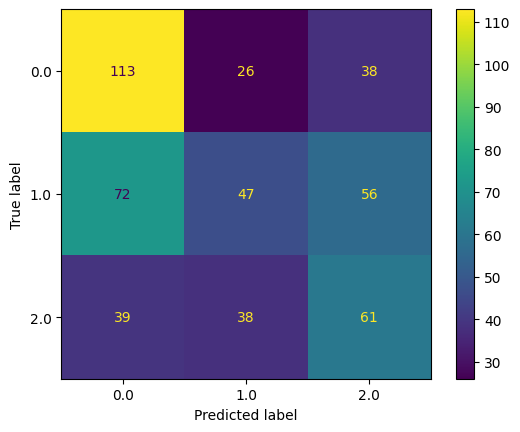

In [44]:
# Apply SVM on PCA dataset

svm_model = svm.SVC(class_weight="balanced", C= 1000, gamma= 0.1, kernel= "rbf")

svm_model.fit(X_train_pca, y_train)
print("Score:", svm_model.score(X_test_pca, y_test))
cv_score = cross_val_score(svm_model, X_train_pca, y_train, cv=5)
print("Cross-validation score, MEAN:", cv_score.mean(), "with STD:", cv_score.std())

# Display confusion matrix and classification report
report = classification_report(y_test, y_pred)
print(report)
y_pred = svm_model.predict(X_test_pca)
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred), display_labels=svm_model.classes_)
disp.plot()
plt.show()


### Conclusion

Given the bad results I realized that de data is **heavily skewed**, now, I will apply a log transform to the data and run the ML algorithms

## APPROACH: apply log-transform

In [58]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PowerTransformer, QuantileTransformer

X = np.log(balanced_df.iloc[:, 1002:].values + 1) # Apply log transform plus constant to avoid 0 values
y = balanced_df['class_label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the date (remove mean and scale to unit variance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

test1 = pd.DataFrame(X, columns=balanced_df.columns[1002:])
test2 = pd.DataFrame(X_train_scaled, columns=balanced_df.columns[1002:])

rf_model = RandomForestClassifier()

# Define the parameter grid to search over
param_grid = {
    'n_estimators': [100, 200, 500],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at every split
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]  # Method of selecting samples for training each tree
}

# Setup GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Perform the grid search on the training data
grid_search_rf.fit(X_train_scaled, y_train)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search_rf.best_params_)
print("Best accuracy found: ", grid_search_rf.best_score_)

# Optionally, evaluate the best model found on the test set
best_rf_model = grid_search_rf.best_estimator_
test_accuracy = best_rf_model.score(X_test_scaled, y_test)
print("Test set accuracy of the best model: ", test_accuracy)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END bootstrap=True, max_features=auto, min_samples_leaf=1, min_samples_split=2

              precision    recall  f1-score   support

         0.0       0.55      0.68      0.61       173
         1.0       0.39      0.33      0.36       179
         2.0       0.32      0.30      0.31       138

    accuracy                           0.44       490
   macro avg       0.42      0.43      0.43       490
weighted avg       0.43      0.44      0.43       490



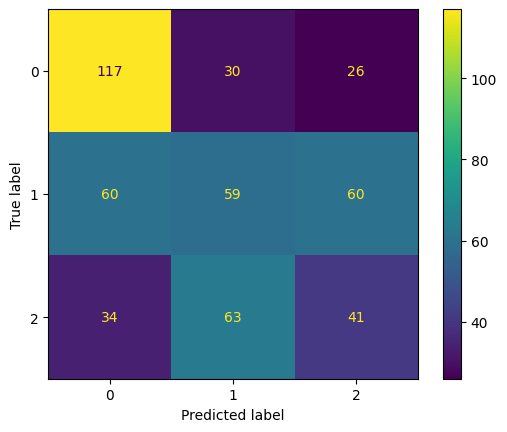

In [60]:
# Get predictions for the test set using the best model
y_pred = best_rf_model.predict(X_test_scaled)

# Display the confusion matrix
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(cm).plot()

# Display the classification report
report = classification_report(y_test, y_pred)
print(report)

## APPROACH: remove correlated variables

In [2]:
l_ear_features_df, r_ear_features_df = process_xdf("Data/AM001/s2/sub-AM001_s2_task6.xdf")
df = l_ear_features_df.iloc[:, 1002:] # Use only the features extracted from the EMG data

Data in folder Data/AM001/s2 is being processed.
Checking if csv files exist.
Files exist. Loading csv files.


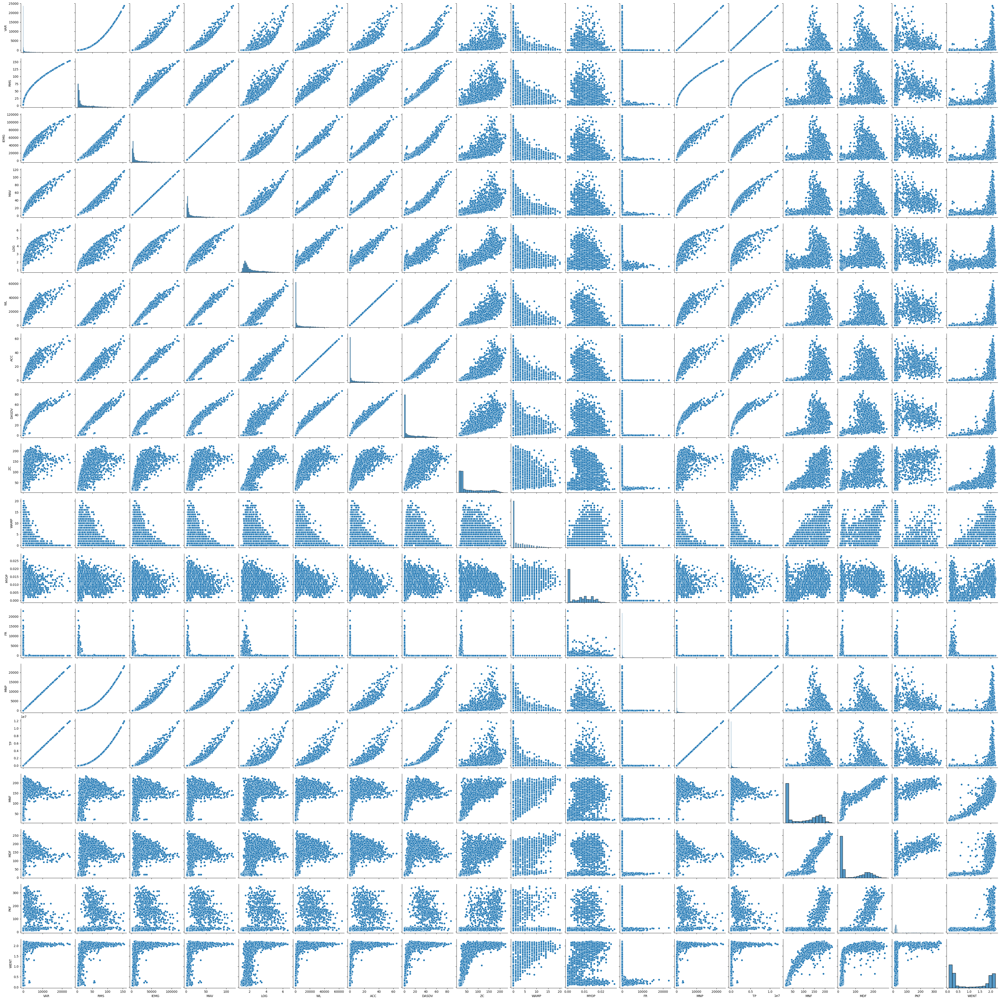

In [61]:
import seaborn as sns

df = l_ear_features_df.iloc[:, 1002:] # Use only the features extracted from the EMG data
sns.pairplot(df)

In [3]:
correlation_df = df.corr(method="pearson")
display(correlation_df)

,VAR,RMS,IEMG,MAV,LOG,WL,ACC,DASDV,ZC,WAMP,MYOP,FR,MNP,TP,MNF,MDF,PKF,WENT
VAR,1.000000,0.929694,0.935641,0.935641,0.821430,0.902778,0.902778,0.883196,0.655078,-0.015662,0.296651,-0.149844,1.000000,1.000000,0.499587,0.479645,0.414605,0.513954
RMS,0.929694,1.000000,0.986909,0.986909,0.935006,0.972717,0.972717,0.986638,0.842041,0.139075,0.464321,-0.219121,0.929704,0.929704,0.727896,0.704269,0.519478,0.728379
IEMG,0.935641,0.986909,1.000000,1.000000,0.962391,0.989236,0.989236,0.975278,0.854418,0.074909,0.398360,-0.207663,0.935644,0.935644,0.692392,0.670274,0.503890,0.691977
MAV,0.935641,0.986909,1.000000,1.000000,0.962391,0.989236,0.989236,0.975278,0.854418,0.074909,0.398360,-0.207663,0.935644,0.935644,0.692392,0.670274,0.503890,0.691977
LOG,0.821430,0.935006,0.962391,0.962391,1.000000,0.958825,0.958825,0.941914,0.919803,0.129671,0.422647,-0.235399,0.821432,0.821432,0.756081,0.726534,0.495185,0.754062
WL,0.902778,0.972717,0.989236,0.989236,0.958825,1.000000,1.000000,0.981860,0.890919,0.089768,0.386599,-0.206397,0.902778,0.902778,0.722305,0.710027,0.547596,0.701789
ACC,0.902778,0.972717,0.989236,0.989236,0.958825,1.000000,1.000000,0.981860,0.890919,0.089768,0.386599,-0.206397,0.902778,0.902778,0.722305,0.710027,0.547596,0.701789
DASDV,0.883196,0.986638,0.975278,0.975278,0.941914,0.981860,0.981860,1.000000,0.895307,0.211080,0.483918,-0.234928,0.883203,0.883203,0.799238,0.779693,0.562492,0.780003
ZC,0.655078,0.842041,0.854418,0.854418,0.919803,0.890919,0.890919,0.895307,1.000000,0.281421,0.495916,-0.256858,0.655080,0.655080,0.875497,0.852881,0.533713,0.844873
WAMP,-0.015662,0.139075,0.074909,0.074909,0.129671,0.089768,0.089768,0.211080,0.281421,1.000000,0.548633,-0.223216,-0.015648,-0.015648,0.655344,0.587851,0.157637,0.623352


In [4]:
# Get the absolute values of the correlation matrix
abs_correlation_matrix = correlation_df.abs()
# display(abs_correlation_matrix.head())

# Get the upper triangular matrix (excluding the diagonal)
upper_triangle = abs_correlation_matrix.where(np.triu(np.ones(abs_correlation_matrix.shape), k=1).astype(bool))
# display(upper_triangle)

# Get the variables with the highest correlation
sorted_correlated_variables = upper_triangle.unstack().sort_values(ascending=False).dropna()
threshold = 0.7
highest_correlated_variables = sorted_correlated_variables[sorted_correlated_variables > threshold]
# Print the top correlated variables
display(highest_correlated_variables)


ACC   WL      1.000000
TP    MNP     1.000000
MAV   IEMG    1.000000
TP    VAR     1.000000
MNP   VAR     1.000000
                ...   
MDF   WL      0.710027
WENT  MYOP    0.707965
MDF   RMS     0.704269
WENT  WL      0.701789
      ACC     0.701789
Length: 74, dtype: float64

In [5]:
sort_highest_correlated_variables = highest_correlated_variables.sort_index()
display(sort_highest_correlated_variables)


ACC  IEMG    0.989236
     LOG     0.958825
     MAV     0.989236
     RMS     0.972717
     VAR     0.902778
               ...   
ZC   IEMG    0.854418
     LOG     0.919803
     MAV     0.854418
     RMS     0.842041
     WL      0.890919
Length: 74, dtype: float64

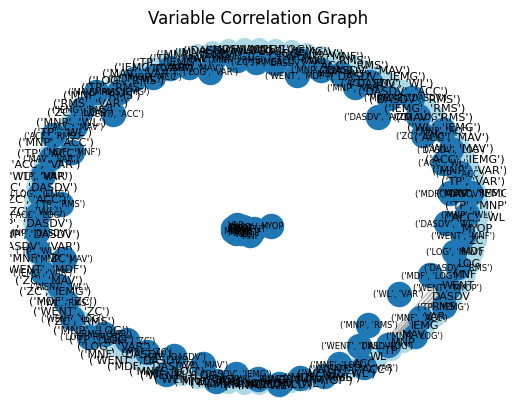

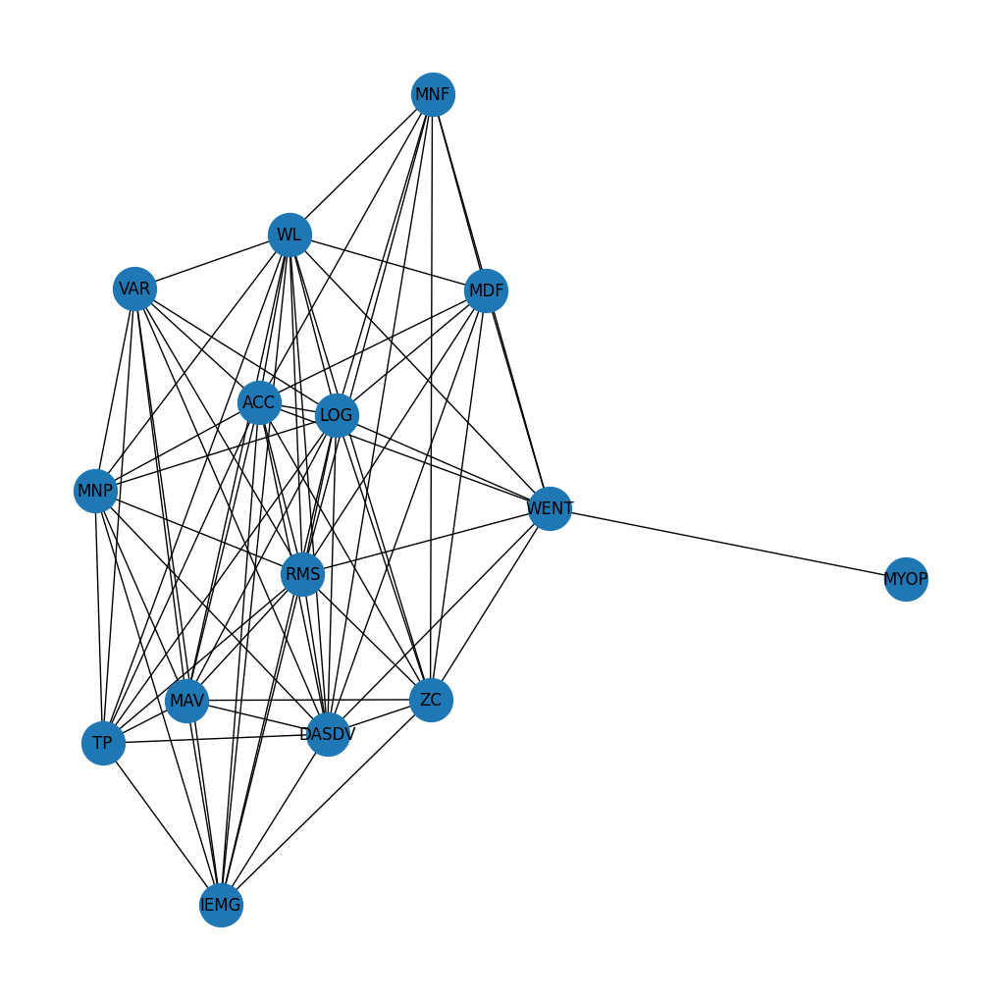

In [14]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph object
G = nx.Graph()

# Add nodes to the graph
for variable in highest_correlated_variables.index:
    G.add_node(variable)

# Add edges to the graph
for variable1, variable2 in highest_correlated_variables.index:
    coefficient = highest_correlated_variables[(variable1, variable2)]
    G.add_edge(variable1, variable2, weight=coefficient)


# Draw nodes and edges
nx.draw_networkx_nodes(G, pos, node_size=200, node_color='lightblue')
nx.draw_networkx_edges(G, pos, width=1, alpha=0.5, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black')

# Draw edge labels
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw(G, font_size=6, with_labels=True)

# Set plot title
plt.title('Variable Correlation Graph')

# Show the plot
plt.axis('off')
plt.show()
